In [1]:
from tensorflow.keras import backend as K

def clear_memory():
    K.clear_session()
    tf.compat.v1.reset_default_graph()

2024-12-19 02:04:32.040302: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-19 02:04:32.727479: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
import os
import random
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Directories for normal and misbehavior images
normal_dir = '/home/UFAD/mohitkukreja/Documents/data_perfect_driving/images'
blurry_dir = '/home/UFAD/mohitkukreja/Documents/data_perfect_driving/images_blurred'
dirt_dir = '/home/UFAD/mohitkukreja/Documents/data_perfect_driving/images_dirt/'
tape_dir = '/home/UFAD/mohitkukreja/Documents/data_perfect_driving/images_tape/'

# Parameters
image_size = (128, 128)  # Resize all images to 128x128
num_normal = 3500
num_misbehavior_per_type = 500
batch_size = 32
test_split = 0.2  # 20% for testing

# Ensure reproducibility
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

# 1. Data Loading and Preprocessing

# Function to load images from a given directory
def load_images_from_dir(dir_path, num_images, image_size=(128, 128)):
    images = []
    filenames = [f for f in os.listdir(dir_path) if f.endswith(".jpg") or f.endswith(".png")]
    selected_filenames = random.sample(filenames, num_images)  # Randomly select images
    for filename in selected_filenames:
        img_path = os.path.join(dir_path, filename)
        img = image.load_img(img_path, target_size=image_size)
        img_array = image.img_to_array(img)
        images.append(img_array)
    return np.array(images)

# Load the images (3,500 normal and 500x3 misbehavior images)
normal_images = load_images_from_dir(normal_dir, num_normal)
blurry_images = load_images_from_dir(blurry_dir, num_misbehavior_per_type)
dirt_images = load_images_from_dir(dirt_dir, num_misbehavior_per_type)
tape_images = load_images_from_dir(tape_dir, num_misbehavior_per_type)

# Combine the images into a single dataset
all_images = np.concatenate([normal_images, blurry_images, dirt_images, tape_images], axis=0)

# Normalize images to [0, 1]
all_images = all_images / 255.0

# Labels: 0 for normal, 1 for blurry, 2 for dirt, 3 for tape (one-hot encoding)
labels = np.concatenate([np.zeros(num_normal), np.ones(num_misbehavior_per_type), 
                         np.ones(num_misbehavior_per_type) * 2, np.ones(num_misbehavior_per_type) * 3])

# Split dataset into training and testing sets (80% training, 20% testing)
train_images, test_images, train_labels, test_labels = train_test_split(all_images, labels, test_size=test_split, random_state=42)

# 2. Data Augmentation for better generalization
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomContrast(0.2),
])

# Apply data augmentation to the training set
train_images = data_augmentation(train_images)

# 3. Define the Encoder Network with Batch Normalization
def build_encoder(latent_dim=64):
    inputs = tf.keras.Input(shape=(128, 128, 3))  # Input layer (128x128 RGB images)
    
    # Convolutional layers with batch normalization
    x = layers.Conv2D(32, (3, 3), activation='relu', strides=2, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    
    # Flatten the output
    x = layers.Flatten()(x)
    
    # Latent space representation
    z_mean = layers.Dense(latent_dim, name="z_mean")(x)
    z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
    
    return models.Model(inputs, [z_mean, z_log_var], name="encoder")

# 4. Sampling function for the latent space
def sampling(args):
    z_mean, z_log_var = args
    batch = tf.shape(z_mean)[0]
    dim = tf.shape(z_mean)[1]
    epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
    return z_mean + tf.exp(0.5 * z_log_var) * epsilon

# 5. Define the Decoder Network with Batch Normalization
def build_decoder(latent_dim=64):
    latent_inputs = tf.keras.Input(shape=(latent_dim,))
    
    # Fully connected layers
    x = layers.Dense(16 * 16 * 128, activation='relu')(latent_inputs)
    x = layers.Reshape((16, 16, 128))(x)
    
    # Transposed convolutional layers with batch normalization
    x = layers.Conv2DTranspose(128, (3, 3), activation='relu', strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2DTranspose(64, (3, 3), activation='relu', strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2DTranspose(32, (3, 3), activation='relu', strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    
    # Output layer (reconstructed image)
    outputs = layers.Conv2D(3, (3, 3), activation="sigmoid", padding="same")(x)
    
    return models.Model(latent_inputs, outputs, name="decoder")

# 6. Define the VAE model
def build_vae(encoder, decoder, latent_dim=64):
    inputs = tf.keras.Input(shape=(128, 128, 3))  # Input layer
    z_mean, z_log_var = encoder(inputs)
    
    # Sample from latent space
    z = layers.Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])
    
    # Decode the latent sample
    reconstructed = decoder(z)
    
    # VAE model
    vae = models.Model(inputs, reconstructed, name="vae")
    
    # Define VAE loss (Reconstruction loss + KL divergence)
    reconstruction_loss = tf.reduce_mean(tf.keras.losses.mean_squared_error(inputs, reconstructed) * 128 * 128)
    kl_loss = -0.5 * tf.reduce_mean(tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=-1))
    vae_loss = reconstruction_loss + kl_loss
    
    vae.add_loss(vae_loss)
    vae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001))
    
    return vae

# 7. Build the encoder, decoder, and VAE models
encoder = build_encoder(latent_dim=64)
decoder = build_decoder(latent_dim=64)
vae = build_vae(encoder, decoder, latent_dim=64)

# 8. Use early stopping to prevent overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# 9. Train the VAE model with data augmentation
vae.fit(train_images, train_images, epochs=100, batch_size=batch_size, validation_data=(test_images, test_images), 
        callbacks=[early_stopping])


2024-12-19 02:04:46.697654: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22316 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:31:00.0, compute capability: 8.6
2024-12-19 02:04:46.699012: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22350 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:b1:00.0, compute capability: 8.6


Epoch 1/100


2024-12-19 02:04:49.826103: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2024-12-19 02:04:50.377356: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2024-12-19 02:04:51.611920: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7fd08d819700 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-12-19 02:04:51.611949: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-12-19 02:04:51.611954: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (1): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-12-19 02:04:51.619967: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-19 

125/125 [==============================] - 9s 19ms/step - loss: 867.0312 - val_loss: 483.1152
Epoch 2/100
125/125 [==============================] - 2s 13ms/step - loss: 72227.4922 - val_loss: 606.0889
Epoch 3/100
125/125 [==============================] - 2s 13ms/step - loss: 363.4760 - val_loss: 601.2661
Epoch 4/100
125/125 [==============================] - 2s 13ms/step - loss: 322.4908 - val_loss: 536.5288
Epoch 5/100
125/125 [==============================] - 2s 13ms/step - loss: 298.0627 - val_loss: 412.4846
Epoch 6/100
125/125 [==============================] - 2s 13ms/step - loss: 280.5429 - val_loss: 293.4186
Epoch 7/100
125/125 [==============================] - 2s 14ms/step - loss: 266.2334 - val_loss: 267.3563
Epoch 8/100
125/125 [==============================] - 2s 13ms/step - loss: 254.8931 - val_loss: 267.1118
Epoch 9/100
125/125 [==============================] - 2s 14ms/step - loss: 244.7684 - val_loss: 258.6446
Epoch 10/100
125/125 [==============================] - 

32/32 [==============================] - 0s 5ms/step - loss: 249.0649
Test loss: 249.06492614746094
32/32 [==============================] - 0s 4ms/step


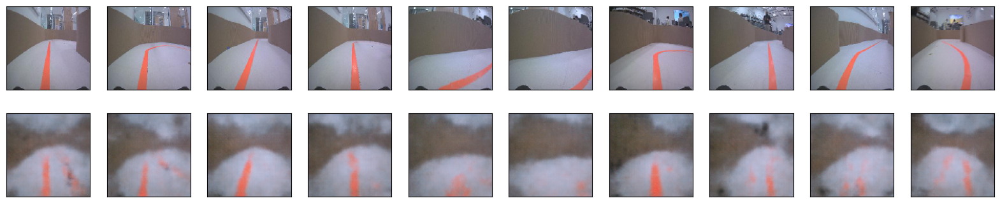

Number of normal images: 950
Number of misbehavior images: 50


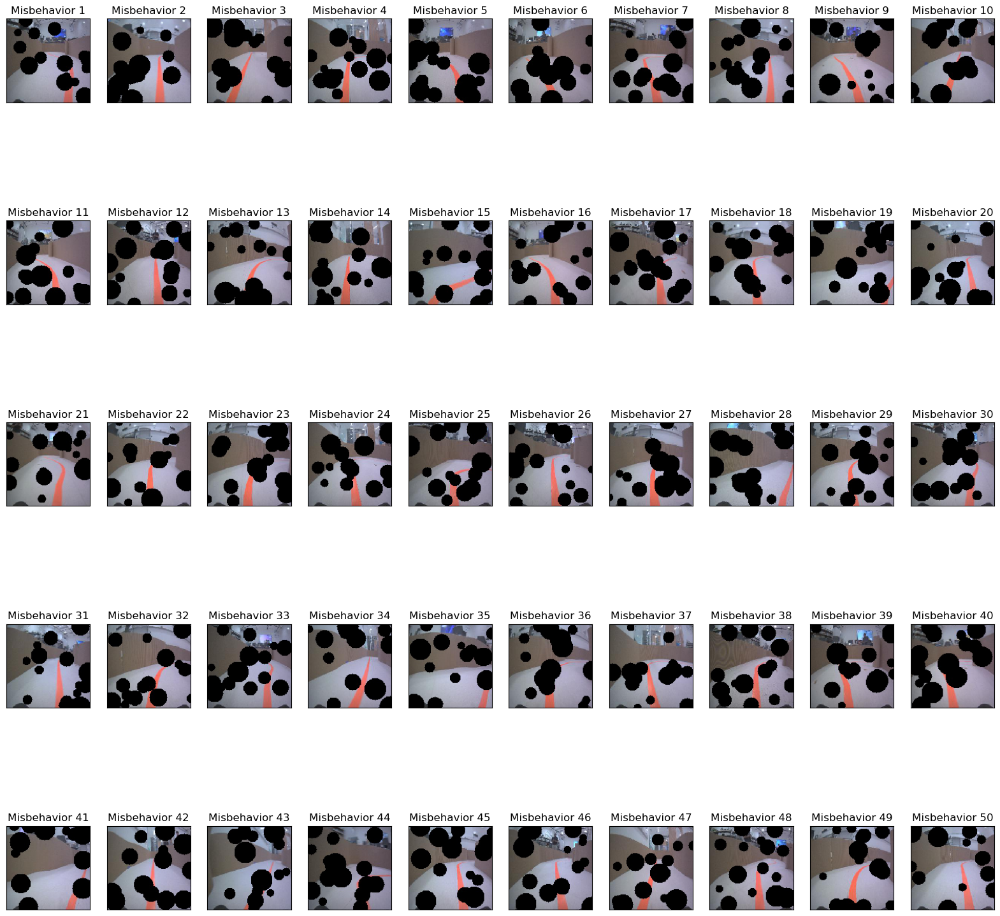

Mean reconstruction error: 0.010421864688396454
Standard deviation of reconstruction error: 0.012404680252075195


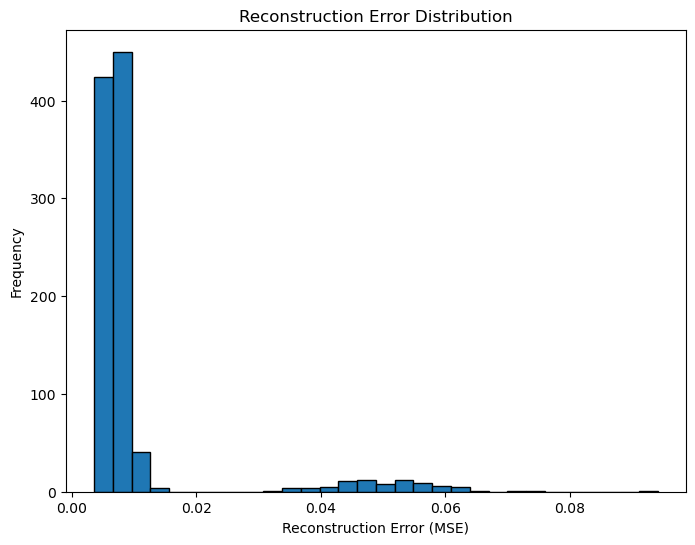

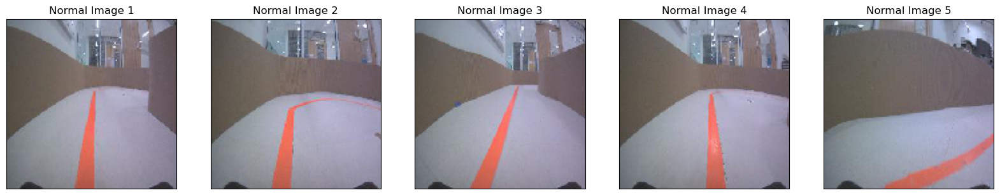

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# 1. Evaluate the model on the test set
test_loss = vae.evaluate(test_images, test_images)
print(f"Test loss: {test_loss}")

# 2. Optionally, generate reconstructed images and visualize them
reconstructed_images = vae.predict(test_images)

# Example to visualize original vs reconstructed images
n = 10  # Number of images to display (for visualization purposes)
plt.figure(figsize=(20, 4))
for i in range(n):
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(test_images[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(reconstructed_images[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

# 3. Function to calculate reconstruction error (MSE) for each image
def calculate_reconstruction_error(original, reconstructed):
    return mean_squared_error(original.flatten(), reconstructed.flatten())

# 4. Calculate reconstruction errors for all test images
reconstruction_errors = []

for i in range(len(test_images)):
    original = test_images[i]
    reconstructed = reconstructed_images[i]
    error = calculate_reconstruction_error(original, reconstructed)
    reconstruction_errors.append(error)

# 5. Calculate a threshold for MSE
threshold = np.mean(reconstruction_errors) + 3 * np.std(reconstruction_errors)  # 3 standard deviations as a margin

# 6. Classify images based on the threshold
normal_images = []
misbehavior_images = []

for i, error in enumerate(reconstruction_errors):
    if error < threshold:
        normal_images.append(i)
    else:
        misbehavior_images.append(i)

# 7. Print the number of normal and misbehavior images
print(f"Number of normal images: {len(normal_images)}")
print(f"Number of misbehavior images: {len(misbehavior_images)}")

# 8. Display all misbehavior images, breaking into multiple rows if necessary
if len(misbehavior_images) > 0:
    rows = (len(misbehavior_images) // 10) + 1  # Choose the number of columns (e.g., 10 images per row)
    plt.figure(figsize=(20, rows * 4))  # Adjust the size of the figure based on the number of rows
    for i, idx in enumerate(misbehavior_images):
        row = i // 10  # Determine which row the image should go in
        col = i % 10   # Determine the column position in that row
        ax = plt.subplot(rows, 10, row * 10 + col + 1)  # Create a grid of images
        plt.imshow(test_images[idx])
        plt.title(f"Misbehavior {i+1}")
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()
else:
    print("No misbehavior images found.")

# 9. Evaluate the model's performance using other metrics
# You can compute metrics such as the reconstruction error distribution
error_distribution = np.array(reconstruction_errors)
print(f"Mean reconstruction error: {np.mean(error_distribution)}")
print(f"Standard deviation of reconstruction error: {np.std(error_distribution)}")

# 10. Optionally, plot the distribution of reconstruction errors
plt.figure(figsize=(8, 6))
plt.hist(error_distribution, bins=30, edgecolor='black')
plt.title('Reconstruction Error Distribution')
plt.xlabel('Reconstruction Error (MSE)')
plt.ylabel('Frequency')
plt.show()

# 11. Optionally, visualize some normal images
plt.figure(figsize=(20, 4))
for i in range(min(5, len(normal_images))):  # Displaying a few normal images
    idx = normal_images[i]
    ax = plt.subplot(1, 5, i + 1)
    plt.imshow(test_images[idx])
    plt.title(f"Normal Image {i+1}")
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()


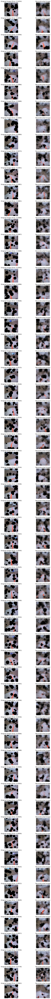

In [4]:
# # 1. Reconstruct the images on the test set
# reconstructed_images = vae.predict(test_images)

# # 2. Calculate reconstruction error (MSE)
# reconstruction_errors = np.mean(np.square(test_images - reconstructed_images), axis=(1, 2, 3))

# 3. Get indices of images with the highest reconstruction errors
num_display_images = 60  # Display top 10 images with the highest reconstruction errors
top_indices = np.argsort(reconstruction_errors)[-num_display_images:]

# 4. Plot the original and reconstructed images with the highest errors
fig, axes = plt.subplots(num_display_images, 2, figsize=(10, num_display_images * 2))

for i, idx in enumerate(top_indices):
    # Original image
    axes[i, 0].imshow(test_images[idx])
    axes[i, 0].set_title(f"Original Image (Error: {reconstruction_errors[idx]:.4f})")
    axes[i, 0].axis("off")
    
    # Reconstructed image
    axes[i, 1].imshow(reconstructed_images[idx])
    axes[i, 1].set_title(f"Reconstructed Image")
    axes[i, 1].axis("off")

plt.tight_layout()
plt.show()
